# Import Dependencies

In [1]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from tensorflow import keras
from tqdm.auto import tqdm
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from tensorflow import keras
import shutil
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.applications import ResNet50V2, VGG16, VGG19, MobileNetV2
from tensorflow.keras.applications.resnet_v2 import preprocess_input as preprocess_resnet50v2
from tensorflow.keras.applications.vgg16 import preprocess_input as preprocess_vgg16
from tensorflow.keras.applications.vgg19 import preprocess_input as preprocess_vgg19
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as preprocess_mobilenetv2
from tensorflow.keras.utils import to_categorical
import shutil
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay


2025-05-11 04:06:03.744728: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746936363.943553      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746936363.998348      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Data Visualization

/kaggle/input/5-flower-types-classification-dataset/flower_images/Orchid
/kaggle/input/5-flower-types-classification-dataset/flower_images/Sunflower
/kaggle/input/5-flower-types-classification-dataset/flower_images/Tulip
/kaggle/input/5-flower-types-classification-dataset/flower_images/Lotus
/kaggle/input/5-flower-types-classification-dataset/flower_images/Lilly


  0%|          | 0/16 [00:00<?, ?it/s]

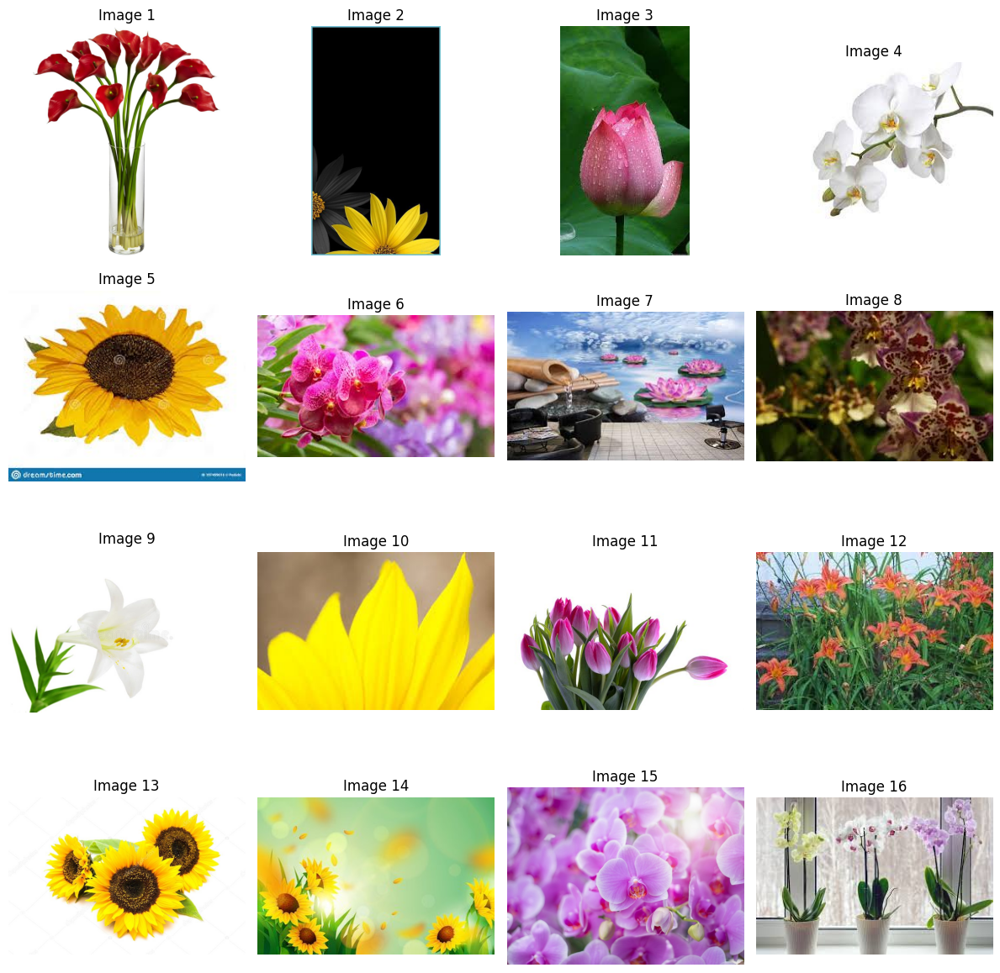

In [2]:

main_folder = r'/kaggle/input/5-flower-types-classification-dataset/flower_images'

# Collect all image paths
images = []
for folder in os.listdir(main_folder):
    path = os.path.join(main_folder, folder)
    print(path)
    for img in os.listdir(path):
        if img.lower().endswith(('.jpg', '.png', '.webp')):
            images.append(os.path.join(path, img))

# Pick 16 random images
random_images = random.sample(images, 16)

# Plot them using matplotlib's imread
plt.figure(figsize=(12, 12))
for i, img_path in enumerate(tqdm(random_images)):
    try:
        img = plt.imread(img_path)
        plt.subplot(4, 4, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Image {i+1}')
    except Exception as e:
        print(f"Error loading image: {img_path}, error: {e}")

plt.tight_layout()
plt.show()


# Data Analysis

In [5]:
source_dir = '/kaggle/input/5-flower-types-classification-dataset/flower_images'
flower_types = os.listdir(source_dir)

print(f"Found {len(flower_types)} flower categories:\n")
for flower in flower_types:
    flower_path = os.path.join(source_dir, flower)
    num_images = len([img for img in os.listdir(flower_path) if img.lower().endswith(('.jpg', '.png', '.webp'))])
    print(f"{flower}: {num_images} images")

Found 5 flower categories:

Orchid: 1000 images
Sunflower: 1000 images
Tulip: 1000 images
Lotus: 1000 images
Lilly: 999 images


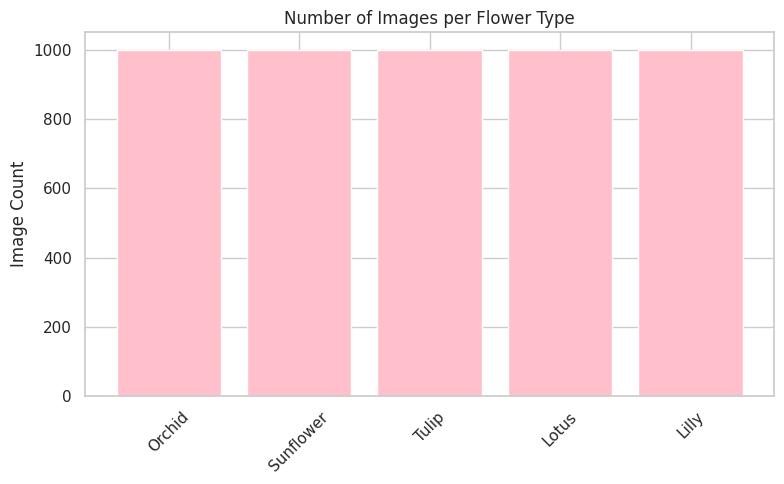

In [27]:
flower_counts = {}
for flower in flower_types:
    path = os.path.join(source_dir, flower)
    count = len([img for img in os.listdir(path) if img.lower().endswith(('.jpg', '.png', '.webp'))])
    flower_counts[flower] = count

plt.figure(figsize=(8, 5))
plt.bar(flower_counts.keys(), flower_counts.values(), color='pink')
plt.title("Number of Images per Flower Type")
plt.ylabel("Image Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [28]:
image_counts = []
for flower in flower_types:
    path = os.path.join(source_dir, flower)
    count = len([img for img in os.listdir(path) if img.lower().endswith(('.jpg', '.png', '.webp'))])
    image_counts.append({"Flower Type": flower, "Image Count": count})

df = pd.DataFrame(image_counts)

print(df.describe())

       Image Count
count     5.000000
mean    999.800000
std       0.447214
min     999.000000
25%    1000.000000
50%    1000.000000
75%    1000.000000
max    1000.000000


In [14]:
code = {'Lotus':0 ,'Tulip':1,'Orchid':2,'lily':3,'Sunflower':4}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

# Data Splitting

In [3]:
source_dir = '/kaggle/input/5-flower-types-classification-dataset/flower_images'
output_dir = '/kaggle/working/dataset_split'

splits = ['train', 'test','pred']
split_ratios = [0.7, 0.2, 0.1]  # Train, Test, Prediction
IMG_SIZE = 100

# Create split folders
for split in splits:
    for flower_type in os.listdir(source_dir):
        os.makedirs(os.path.join(output_dir, split, flower_type), exist_ok=True)

# Split the data into folders
for flower_type in os.listdir(source_dir):
    full_path = os.path.join(source_dir, flower_type)
    images = [img for img in os.listdir(full_path) if img.lower().endswith(('.jpg', '.png', '.webp'))]
    
    random.shuffle(images)
    train_size = int(len(images) * split_ratios[0])
    test_size = int(len(images) * split_ratios[1])
    
    train_imgs = images[:train_size]
    test_imgs = images[train_size:train_size+test_size]
    pred_imgs = images[train_size+test_size:]

    for img_list, split in zip([train_imgs, test_imgs, pred_imgs], splits):
        for img in img_list:
            src = os.path.join(full_path, img)
            dst = os.path.join(output_dir, split, flower_type, img)
            shutil.copy(src, dst)

# Load data as arrays (X, y)
def load_data(split_dir):
    data = []
    categories = os.listdir(split_dir)
    for label, category in enumerate(categories):
        category_path = os.path.join(split_dir, category)
        for img_file in tqdm(os.listdir(category_path), desc=f"Loading {category}"):
            try:
                img_path = os.path.join(category_path, img_file)
                img = cv2.imread(img_path, cv2.IMREAD_COLOR)
                img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
                data.append([img, label])
            except:
                pass
    random.shuffle(data)
    X = np.array([item[0] for item in data])
    y = np.array([item[1] for item in data])
    return X, y

# Load each dataset
X_train, y_train = load_data(os.path.join(output_dir, 'train'))
X_test, y_test = load_data(os.path.join(output_dir, 'test'))
X_pred, y_pred = load_data(os.path.join(output_dir, 'pred'))


Loading Tulip:   0%|          | 0/700 [00:00<?, ?it/s]

Loading Lotus:   0%|          | 0/700 [00:00<?, ?it/s]

Loading Sunflower:   0%|          | 0/700 [00:00<?, ?it/s]

Loading Lilly:   0%|          | 0/699 [00:00<?, ?it/s]

Loading Orchid:   0%|          | 0/700 [00:00<?, ?it/s]

Loading Tulip:   0%|          | 0/200 [00:00<?, ?it/s]

Loading Lotus:   0%|          | 0/200 [00:00<?, ?it/s]

Loading Sunflower:   0%|          | 0/200 [00:00<?, ?it/s]

Loading Lilly:   0%|          | 0/199 [00:00<?, ?it/s]

Loading Orchid:   0%|          | 0/200 [00:00<?, ?it/s]

Loading Tulip:   0%|          | 0/100 [00:00<?, ?it/s]

Loading Lotus:   0%|          | 0/100 [00:00<?, ?it/s]

Loading Sunflower:   0%|          | 0/100 [00:00<?, ?it/s]

Loading Lilly:   0%|          | 0/101 [00:00<?, ?it/s]

Loading Orchid:   0%|          | 0/100 [00:00<?, ?it/s]

In [11]:
print(y_train[:50])

[3 0 3 4 2 3 2 3 0 3 3 4 3 3 4 2 1 4 2 0 3 3 0 2 0 4 4 3 3 3 2 1 2 0 1 3 1
 1 4 4 1 0 2 3 3 1 2 2 1 4]


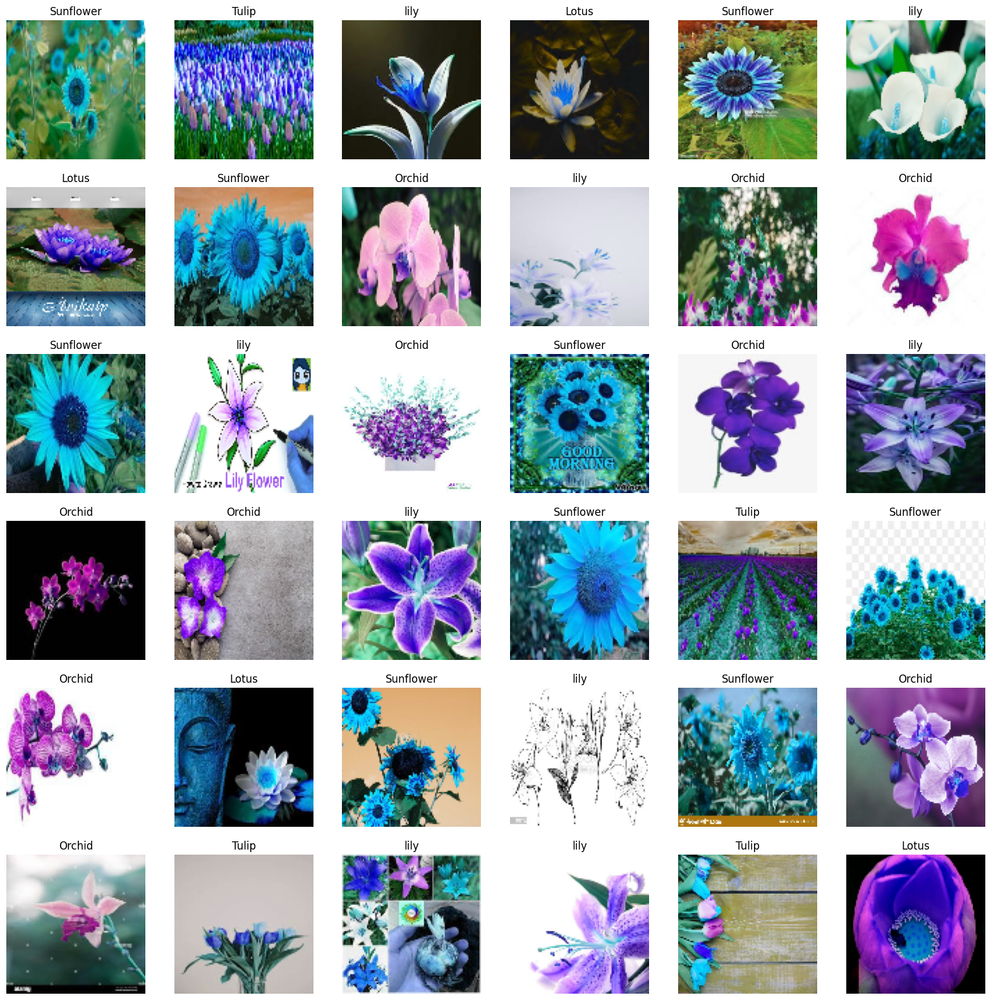

In [15]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    plt.title(getcode(y_train[i]))

# CNN Data Generators

In [16]:
train_path = '/kaggle/working/dataset_split/train'
test_path = '/kaggle/working/dataset_split/test'
pred_path = '/kaggle/working/dataset_split/pred'

In [5]:
IMG_SIZE = 224
batch_size = 32

In [6]:
def cnn_preprocess(x):
    return x/255.0

In [7]:
cnn_train_datagen = ImageDataGenerator(preprocessing_function=cnn_preprocess)
cnn_train_generator = cnn_train_datagen.flow_from_directory(
        train_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 3499 images belonging to 5 classes.


In [37]:
cnn_train_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [8]:
cnn_val_datagen = ImageDataGenerator(preprocessing_function=cnn_preprocess)
cnn_val_generator = cnn_val_datagen.flow_from_directory(
        test_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 999 images belonging to 5 classes.


In [39]:
cnn_val_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [17]:
cnn_pred_datagen = ImageDataGenerator(preprocessing_function=cnn_preprocess)
cnn_pred_generator = cnn_pred_datagen.flow_from_directory(
        pred_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 501 images belonging to 5 classes.


# CNN MODEL 1

In [9]:
cnn_model = keras.Sequential([
    keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),

    keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Flatten(),
    keras.layers.Dropout(0.4),

    keras.layers.Dense(units=128, activation='relu'),
    keras.layers.Dense(units=64, activation='relu'),
    keras.layers.Dense(units=64, activation='relu'),

    keras.layers.Dense(units=len(cnn_val_generator.class_indices), activation='softmax', dtype='float32')
])

I0000 00:00:1746936499.335018      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


In [41]:
cnn_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 5)                   │             325 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,201,029 (42.73 MB)

 Trainable params: 11,201,029 (42.73 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
callbacks = [
    EarlyStopping(
        monitor='val_loss',    
        patience=5,             
        restore_best_weights=True
    ),
    
    ModelCheckpoint(
        filepath='CNN_best_model.keras',  
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False, 
        mode='min',
        verbose=1
    )
]

In [11]:
cnn_model.compile(optimizer=keras.optimizers.Adam(), 
              loss=keras.losses.CategoricalCrossentropy(), 
               metrics=['accuracy',keras.metrics.Precision(name='precision'),keras.metrics.Recall(name='recall')
])

In [12]:
cnn_history = cnn_model.fit(
        cnn_train_generator,
        epochs = 10,
        validation_data = cnn_val_generator,
        callbacks = callbacks
        )

Epoch 1/10


I0000 00:00:1746936531.098087     109 service.cc:148] XLA service 0x7c1c1c0033e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1746936531.098796     109 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1746936531.492004     109 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/110 ━━━━━━━━━━━━━━━━━━━━ 18:06 10s/step - accuracy: 0.1875 - loss: 1.6110 - precision: 0.0000e+00 - recall: 0.0000e+00

I0000 00:00:1746936536.238075     109 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - accuracy: 0.3290 - loss: 1.4725 - precision: 0.5699 - recall: 0.0948
Epoch 1: val_loss improved from inf to 1.13097, saving model to CNN_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 29s 172ms/step - accuracy: 0.3297 - loss: 1.4712 - precision: 0.5710 - recall: 0.0955 - val_accuracy: 0.5215 - val_loss: 1.1310 - val_precision: 0.7488 - val_recall: 0.3193
Epoch 2/10
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.5659 - loss: 1.1003 - precision: 0.6885 - recall: 0.3403
Epoch 2: val_loss improved from 1.13097 to 0.94631, saving model to CNN_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - accuracy: 0.5663 - loss: 1.0995 - precision: 0.6889 - recall: 0.3410 - val_accuracy: 0.6116 - val_loss: 0.9463 - val_precision: 0.7643 - val_recall: 0.4545
Epoch 3/10
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.6545 - loss: 0.9070 - precision: 0.7715 - recall: 0.4955
Epoch 3: val_loss improved from 0.94631 to 0.81996, saving m

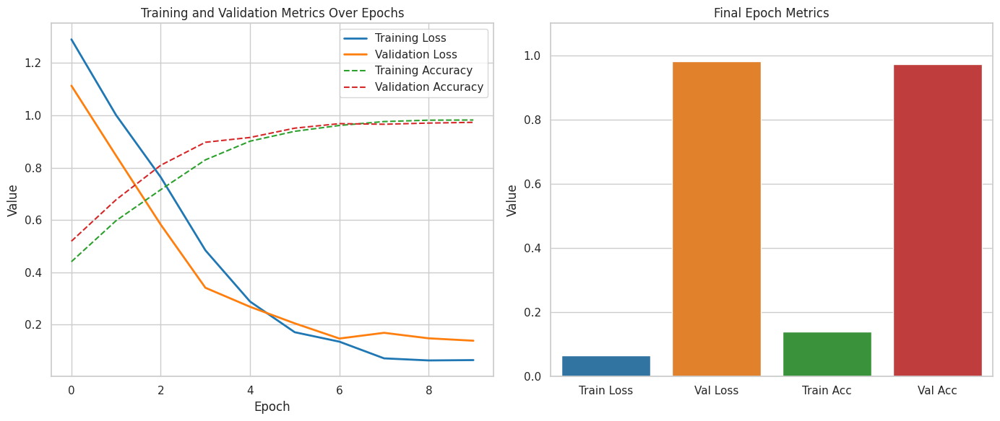

In [45]:
import seaborn as sns

# Apply Seaborn style
sns.set(style="whitegrid")

# Get last epoch values for bar chart
last_epoch = len(cnn_history.history['loss']) - 1
metrics = ['loss', 'accuracy']
train_last = [cnn_history.history['loss'][last_epoch], cnn_history.history['accuracy'][last_epoch]]
val_last = [cnn_history.history['val_loss'][last_epoch], cnn_history.history['val_accuracy'][last_epoch]]

# Plot
plt.figure(figsize=(14, 6))

# Line Plot (Trend Over Epochs)
plt.subplot(1, 2, 1)
plt.plot(cnn_history.history['loss'], label='Training Loss', color='#1f77b4', linewidth=2)
plt.plot(cnn_history.history['val_loss'], label='Validation Loss', color='#ff7f0e', linewidth=2)
plt.plot(cnn_history.history['accuracy'], label='Training Accuracy', color='#2ca02c', linestyle='--')
plt.plot(cnn_history.history['val_accuracy'], label='Validation Accuracy', color='#d62728', linestyle='--')
plt.title('Training and Validation Metrics Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.grid(True)

# Bar Plot (Final Epoch)
plt.subplot(1, 2, 2)
x = ['Train Loss', 'Val Loss', 'Train Acc', 'Val Acc']
y = train_last + val_last
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
sns.barplot(x=x, y=y, palette=colors)
plt.title('Final Epoch Metrics')
plt.ylim(0, 1.1)
plt.ylabel('Value')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


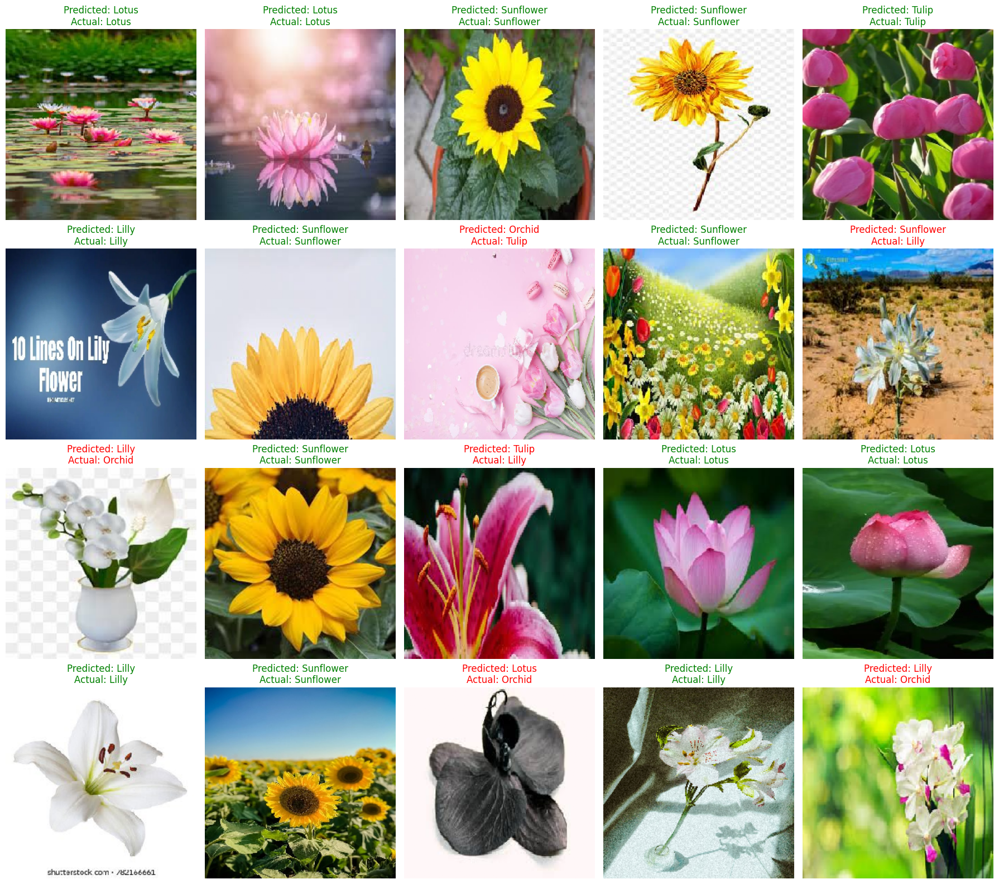

In [18]:
# Get class indices 
class_indices = cnn_pred_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Get a batch of images and labels
images, labels = next(cnn_val_generator)

# Predict on this batch
predictions = cnn_model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(labels, axis=1)

# Plot first 20 predictions
plt.figure(figsize=(18, 16))  
for i in range(20):
    plt.subplot(4, 5, i+1)  
    plt.imshow(images[i])
    plt.axis('off')
    plt.title(f"Predicted: {idx_to_class[predicted_classes[i]]}\nActual: {idx_to_class[true_classes[i]]}",
              color="green" if predicted_classes[i]==true_classes[i] else "red")
plt.tight_layout()
plt.show()

In [19]:
y_pred_probs = cnn_model.predict(cnn_val_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)

# Get true labels from generator
y_true = cnn_val_generator.classes

32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 86ms/step


# Evaluate the model


In [20]:
# Evaluate the model
results = cnn_model.evaluate(cnn_val_generator, verbose=1)

loss_cnn = results[0]
accuracy_cnn = results[1]

# Print loss and accuracy
print(f"Test Loss: {loss_cnn}")
print(f"Test Accuracy: {accuracy_cnn}")

32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 81ms/step - accuracy: 0.7319 - loss: 0.7353 - precision: 0.7866 - recall: 0.6703
Test Loss: 0.7460274696350098
Test Accuracy: 0.7327327132225037


# Classification Report

In [22]:
target_names = list(cnn_val_generator.class_indices.keys())
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))


Classification Report:
              precision    recall  f1-score   support

       Lilly       0.23      0.23      0.23       199
       Lotus       0.23      0.21      0.22       200
      Orchid       0.23      0.26      0.24       200
   Sunflower       0.23      0.27      0.25       200
       Tulip       0.22      0.18      0.20       200

    accuracy                           0.23       999
   macro avg       0.23      0.23      0.23       999
weighted avg       0.23      0.23      0.23       999



# Confusion Matrix

In [23]:
class_labels = list(cnn_pred_generator.class_indices.keys())
# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Create a labeled DataFrame
cm_df = pd.DataFrame(cm, index=class_labels, columns=class_labels)

print("Confusion Matrix:\n")
print(cm_df)

Confusion Matrix:

           Lilly  Lotus  Orchid  Sunflower  Tulip
Lilly         45     38      32         47     37
Lotus         46     42      46         39     27
Orchid        31     34      51         46     38
Sunflower     34     35      49         53     29
Tulip         39     30      48         47     36


# CNN Model 2

In [24]:
cnn2_pred_datagen = ImageDataGenerator(preprocessing_function=cnn_preprocess)
cnn2_pred_generator = cnn2_pred_datagen.flow_from_directory(
        pred_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 501 images belonging to 5 classes.


In [ ]:
cnn_pred_generator.class_indices

In [25]:
cnn2_model = keras.Sequential([
    keras.layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3)),

    keras.layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    keras.layers.MaxPooling2D(pool_size=(2, 2)),

    keras.layers.Flatten(),
    keras.layers.Dropout(0.5),

    keras.layers.Dense(units=128, activation='relu'),
    keras.layers.Dense(units=64, activation='relu'),
    keras.layers.Dense(units=64, activation='relu'),

    keras.layers.Dense(units=len(cnn_val_generator.class_indices), activation='softmax', dtype='float32')
])

In [26]:
cnn2_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 128)       │           3,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 43264)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 43264)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │       5,537,920 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 64)                  │           4,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 5)                   │             325 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,664,965 (21.61 MB)

 Trainable params: 5,664,965 (21.61 MB)

 Non-trainable params: 0 (0.00 B)

In [27]:
callbacks = [
    EarlyStopping(
        monitor='val_loss',    
        patience=5,             
        restore_best_weights=True
    ),
    
    ModelCheckpoint(
        filepath='CNN2_best_model.keras',  
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False, 
        mode='min',
        verbose=1
    )
]

In [28]:
cnn2_model.compile(optimizer=keras.optimizers.Adam(), 
              loss=keras.losses.CategoricalCrossentropy(), 
               metrics=['accuracy',keras.metrics.Precision(name='precision'),keras.metrics.Recall(name='recall')
])

In [29]:
cnn2_history = cnn_model.fit(
        cnn_train_generator,
        epochs = 10,
        validation_data = cnn_val_generator,
        callbacks = callbacks
        )

Epoch 1/10
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8849 - loss: 0.3337 - precision: 0.9168 - recall: 0.8518
Epoch 1: val_loss improved from inf to 0.70330, saving model to CNN2_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 14s 120ms/step - accuracy: 0.8847 - loss: 0.3342 - precision: 0.9166 - recall: 0.8516 - val_accuracy: 0.7738 - val_loss: 0.7033 - val_precision: 0.8078 - val_recall: 0.7487
Epoch 2/10
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9365 - loss: 0.1970 - precision: 0.9495 - recall: 0.9216
Epoch 2: val_loss did not improve from 0.70330
110/110 ━━━━━━━━━━━━━━━━━━━━ 13s 110ms/step - accuracy: 0.9363 - loss: 0.1975 - precision: 0.9494 - recall: 0.9214 - val_accuracy: 0.7968 - val_loss: 0.7401 - val_precision: 0.8142 - val_recall: 0.7678
Epoch 3/10
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9583 - loss: 0.1276 - precision: 0.9683 - recall: 0.9482
Epoch 3: val_loss did not improve from 0.70330
110/110 ━━━━━━━━━━━━━━━━━━━━ 13s 111ms/step 

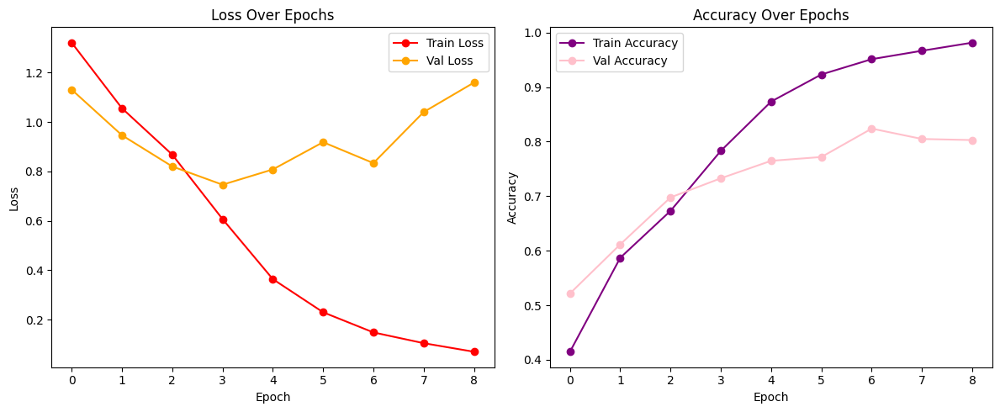

In [30]:
# Plotting training and validation loss and accuracy
plt.figure(figsize=(12, 5))

# Loss
plt.subplot(1, 2, 1)
plt.plot(cnn_history.history['loss'], label='Train Loss', marker='o', color='red')
plt.plot(cnn_history.history['val_loss'], label='Val Loss', marker='o', color='orange')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

#  Accuracy
plt.subplot(1, 2, 2)
plt.plot(cnn_history.history['accuracy'], label='Train Accuracy', marker='o', color='purple')
plt.plot(cnn_history.history['val_accuracy'], label='Val Accuracy', marker='o', color='pink')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


# Evaluate the model

In [31]:
# Evaluate the model
results = cnn_model.evaluate(cnn2_pred_generator, verbose=1)

# If you have only loss and accuracy:
loss_cnn2 = results[0]
accuracy_cnn2 = results[1]

# Print loss and accuracy
print(f"Test Loss: {loss_cnn2}")
print(f"Test Accuracy: {accuracy_cnn2}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - accuracy: 0.7750 - loss: 0.7055 - precision: 0.8175 - recall: 0.7414
Test Loss: 0.7254219055175781
Test Accuracy: 0.7764471173286438


# Classification Report

In [32]:
y_pred_probs = cnn_model.predict(cnn2_pred_generator, verbose=1)
y_pred = np.argmax(y_pred_probs, axis=1)

# Get true labels from generator
y_true = cnn2_pred_generator.classes

16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step


In [33]:
target_names = list(cnn2_pred_generator.class_indices.keys())
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))

Classification Report:
              precision    recall  f1-score   support

       Lilly       0.22      0.20      0.21       101
       Lotus       0.16      0.14      0.15       100
      Orchid       0.15      0.17      0.16       100
   Sunflower       0.22      0.26      0.24       100
       Tulip       0.22      0.20      0.21       100

    accuracy                           0.19       501
   macro avg       0.19      0.19      0.19       501
weighted avg       0.19      0.19      0.19       501



# Confusion Matrix

In [34]:
target_names = list(cnn2_pred_generator.class_indices.keys())
print("Classification Report:")
print(confusion_matrix(y_true, y_pred))

Classification Report:
[[20 24 23 20 14]
 [27 14 23 23 13]
 [14 16 17 27 26]
 [12 19 23 26 20]
 [17 15 26 22 20]]


# VGG16

## VGG16 Data Generators

In [56]:
train_path = '/kaggle/working/dataset_split/train'
test_path = '/kaggle/working/dataset_split/test'
pred_path = '/kaggle/working/dataset_split/pred'

In [57]:
IMG_SIZE = 224
batch_size = 32

In [35]:
VGG16_train_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16)
VGG16_train_generator = VGG16_train_datagen.flow_from_directory(
        train_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 3499 images belonging to 5 classes.


In [59]:
VGG16_train_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [36]:
VGG16_val_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16)
VGG16_val_generator = VGG16_val_datagen.flow_from_directory(
        test_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 999 images belonging to 5 classes.


In [61]:
VGG16_val_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [38]:
VGG16_pred_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg16)
VGG16_pred_generator = VGG16_pred_datagen.flow_from_directory(
        pred_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 501 images belonging to 5 classes.


In [ ]:
VGG16_pred_generator.class_indices

# VGG16 Modeling

In [39]:
trained_VGG16_layers = VGG16(weights='imagenet',include_top=False,input_shape=(IMG_SIZE,IMG_SIZE,3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [40]:
for layer in trained_VGG16_layers.layers:
    layer.trainable = False

In [41]:
VGG16_model = keras.models.Sequential([
    trained_VGG16_layers,
    keras.layers.Flatten(),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(len(VGG16_val_generator.class_indices), activation='softmax')
]) 

In [42]:
VGG16_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,138,757 (80.64 MB)

 Trainable params: 6,424,069 (24.51 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [43]:
callbacks = [
    EarlyStopping(
        monitor='val_loss',    
        patience=5,             
        restore_best_weights=True
    ),
    
    ModelCheckpoint(
        filepath='VGG16_best_model.keras',  
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False, 
        mode='min',
        verbose=1
    )
]

In [44]:
VGG16_model.compile(optimizer=keras.optimizers.Adam(), 
              loss=keras.losses.CategoricalCrossentropy(), 
               metrics=['accuracy',keras.metrics.Precision(name='precision'),keras.metrics.Recall(name='recall')
])

In [45]:
VGG16_history = VGG16_model.fit(
        VGG16_train_generator,
        epochs = 20,
        validation_data = VGG16_val_generator,
        callbacks = callbacks
        )

Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - accuracy: 0.6026 - loss: 11.5209 - precision: 0.6208 - recall: 0.5849
Epoch 1: val_loss improved from inf to 0.51530, saving model to VGG16_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 32s 194ms/step - accuracy: 0.6036 - loss: 11.4540 - precision: 0.6220 - recall: 0.5858 - val_accuracy: 0.8448 - val_loss: 0.5153 - val_precision: 0.9288 - val_recall: 0.7578
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - accuracy: 0.9187 - loss: 0.2462 - precision: 0.9564 - recall: 0.8897
Epoch 2: val_loss improved from 0.51530 to 0.42410, saving model to VGG16_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 15s 133ms/step - accuracy: 0.9187 - loss: 0.2464 - precision: 0.9563 - recall: 0.8898 - val_accuracy: 0.8709 - val_loss: 0.4241 - val_precision: 0.9011 - val_recall: 0.8478
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9689 - loss: 0.0936 - precision: 0.9793 - recall: 0.9657
Epoch 3: val_loss improved from 0.42410 to

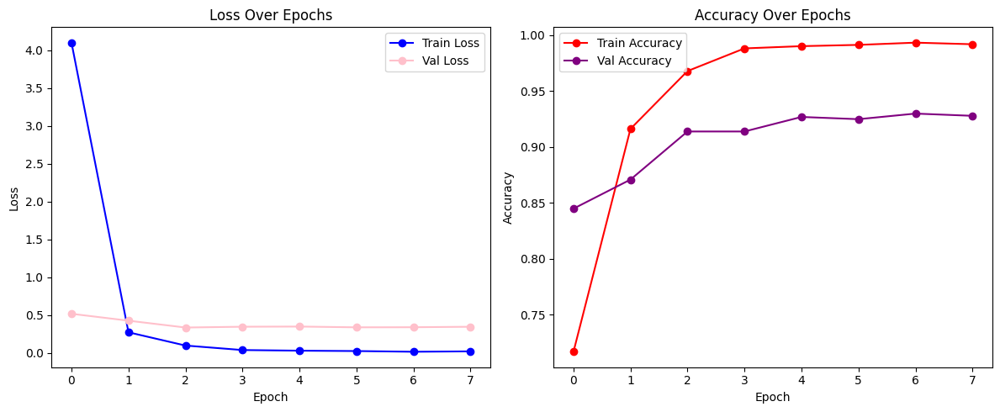

In [46]:
# Plotting training and validation loss and accuracy
plt.figure(figsize=(12, 5))

#  Loss
plt.subplot(1, 2, 1)
plt.plot(VGG16_history.history['loss'], label='Train Loss', marker='o', color='blue')
plt.plot(VGG16_history.history['val_loss'], label='Val Loss', marker='o', color='pink')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(VGG16_history.history['accuracy'], label='Train Accuracy', marker='o', color='red')
plt.plot(VGG16_history.history['val_accuracy'], label='Val Accuracy', marker='o', color='purple')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


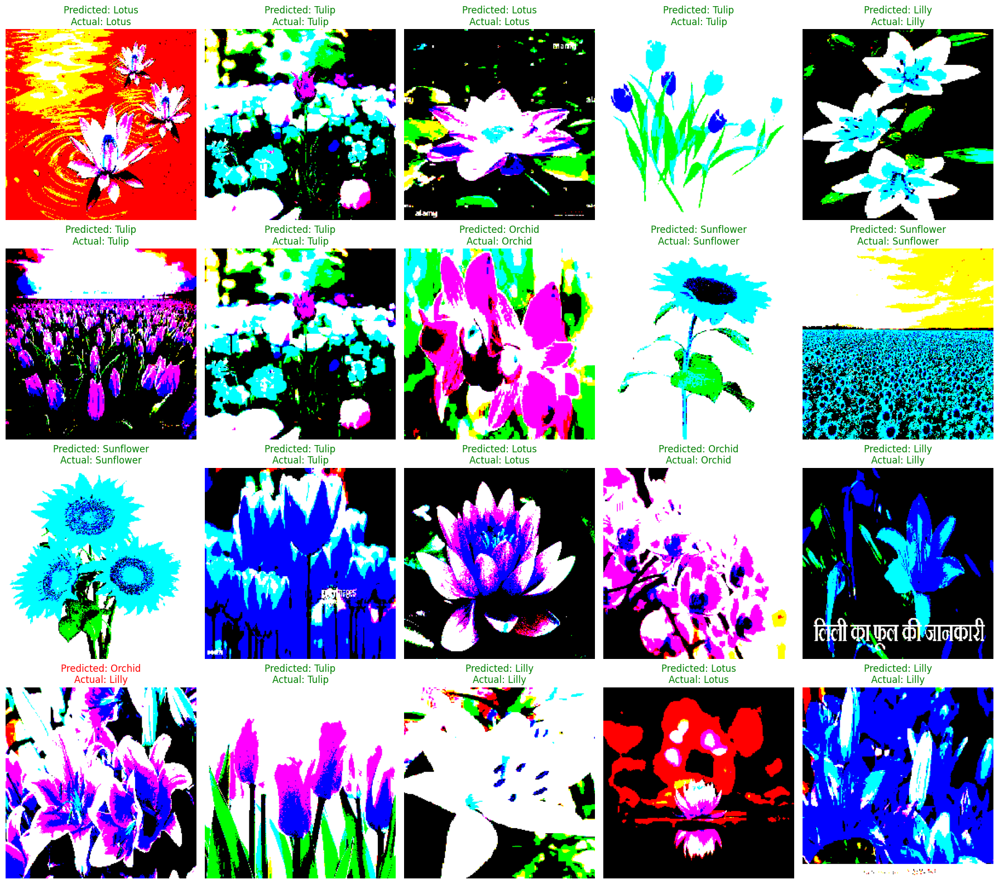

In [47]:
# Get class indices 
class_indices = VGG16_pred_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Get a batch of images and labels
images, labels = next(VGG16_pred_generator)

# Predict on this batch
predictions = VGG16_model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(labels, axis=1)

# Plot first 20 predictions
plt.figure(figsize=(18, 16))  
for i in range(20):
    plt.subplot(4, 5, i+1)  
    plt.imshow(images[i])
    plt.axis('off')
    plt.title(f"Predicted: {idx_to_class[predicted_classes[i]]}\nActual: {idx_to_class[true_classes[i]]}",
              color="green" if predicted_classes[i]==true_classes[i] else "red")
plt.tight_layout()
plt.show()

# Evaluate the model

In [48]:
# Evaluate the model
results = VGG16_model.evaluate(VGG16_pred_generator, verbose=1)

# If you have only loss and accuracy:
loss_VGG16 = results[0]
accuracy_VGG16 = results[1]

# Print loss and accuracy
print(f"Test Loss: {loss_VGG16}")
print(f"Test Accuracy: {accuracy_VGG16}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 388ms/step - accuracy: 0.9073 - loss: 0.3441 - precision: 0.9252 - recall: 0.8985
Test Loss: 0.3548195958137512
Test Accuracy: 0.9021956324577332


In [49]:
y_pred_probs = VGG16_model.predict(VGG16_pred_generator, verbose=1)

# Convert probabilities to class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Get true labels from the generator
y_true = VGG16_pred_generator.classes

# Get class names (labels) from the generator
target_names = list(VGG16_pred_generator.class_indices.keys())
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 127ms/step
Classification Report:
              precision    recall  f1-score   support

       Lilly       0.21      0.20      0.20       101
       Lotus       0.19      0.19      0.19       100
      Orchid       0.19      0.18      0.18       100
   Sunflower       0.25      0.25      0.25       100
       Tulip       0.25      0.26      0.25       100

    accuracy                           0.22       501
   macro avg       0.21      0.22      0.22       501
weighted avg       0.21      0.22      0.22       501



In [50]:
target_names = list(VGG16_pred_generator.class_indices.keys())
print("Confusion_Matrix")
print(confusion_matrix(y_true, y_pred))

Confusion_Matrix
[[20 18 14 21 28]
 [21 19 24 25 11]
 [20 26 18 19 17]
 [15 16 20 25 24]
 [20 22 21 11 26]]


# VGG19 Model

## VGG19 Data Generators

In [ ]:
train_path = '/kaggle/working/dataset_split/train'
test_path = '/kaggle/working/dataset_split/test'
pred_path = '/kaggle/working/dataset_split/pred'

In [ ]:
IMG_SIZE = 224
batch_size = 32

In [51]:
VGG19_train_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg19)
VGG19_train_generator = VGG19_train_datagen.flow_from_directory(
        train_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 3499 images belonging to 5 classes.


In [64]:
VGG19_train_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [52]:
VGG19_val_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg19)
VGG19_val_generator = VGG19_val_datagen.flow_from_directory(
        test_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 999 images belonging to 5 classes.


In [66]:
VGG19_val_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [53]:
VGG19_pred_datagen = ImageDataGenerator(preprocessing_function=preprocess_vgg19)
VGG19_pred_generator = VGG16_pred_datagen.flow_from_directory(
        pred_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 501 images belonging to 5 classes.


In [ ]:
VGG16_pred_generator.class_indices

## VGG19 Modeling

In [54]:
trained_VGG19_layers = VGG19(weights='imagenet',include_top=False,input_shape=(IMG_SIZE,IMG_SIZE,3))

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [55]:
for layer in trained_VGG19_layers.layers:
    layer.trainable = False


In [57]:
VGG19_model = keras.models.Sequential([
    trained_VGG19_layers,
    keras.layers.Flatten(),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(len(VGG16_val_generator.class_indices), activation='softmax')
]) 

In [58]:
VGG19_model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 7, 7, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,448,453 (100.89 MB)

 Trainable params: 6,424,069 (24.51 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [59]:
callbacks = [
    EarlyStopping(
        monitor='val_loss',    
        patience=5,             
        restore_best_weights=True
    ),
    
    ModelCheckpoint(
        filepath='VGG19_best_model.keras',  
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False, 
        mode='min',
        verbose=1
    )
]

In [60]:
VGG19_model.compile(optimizer=keras.optimizers.Adam(), 
              loss=keras.losses.CategoricalCrossentropy(), 
               metrics=['accuracy',keras.metrics.Precision(name='precision'),keras.metrics.Recall(name='recall')
])

In [61]:
VGG19_history = VGG19_model.fit(
        VGG19_train_generator,
        epochs = 20,
        validation_data = VGG19_val_generator,
        callbacks = callbacks
        )

Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - accuracy: 0.6429 - loss: 7.7450 - precision: 0.6513 - recall: 0.6317
Epoch 1: val_loss improved from inf to 0.61859, saving model to VGG19_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - accuracy: 0.6438 - loss: 7.7020 - precision: 0.6523 - recall: 0.6324 - val_accuracy: 0.8188 - val_loss: 0.6186 - val_precision: 0.8475 - val_recall: 0.8008
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - accuracy: 0.9227 - loss: 0.2405 - precision: 0.9378 - recall: 0.9111
Epoch 2: val_loss improved from 0.61859 to 0.42570, saving model to VGG19_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 16s 138ms/step - accuracy: 0.9229 - loss: 0.2403 - precision: 0.9379 - recall: 0.9112 - val_accuracy: 0.8779 - val_loss: 0.4257 - val_precision: 0.8963 - val_recall: 0.8569
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - accuracy: 0.9794 - loss: 0.0642 - precision: 0.9829 - recall: 0.9761
Epoch 3: val_loss improved from 0.42570 to 

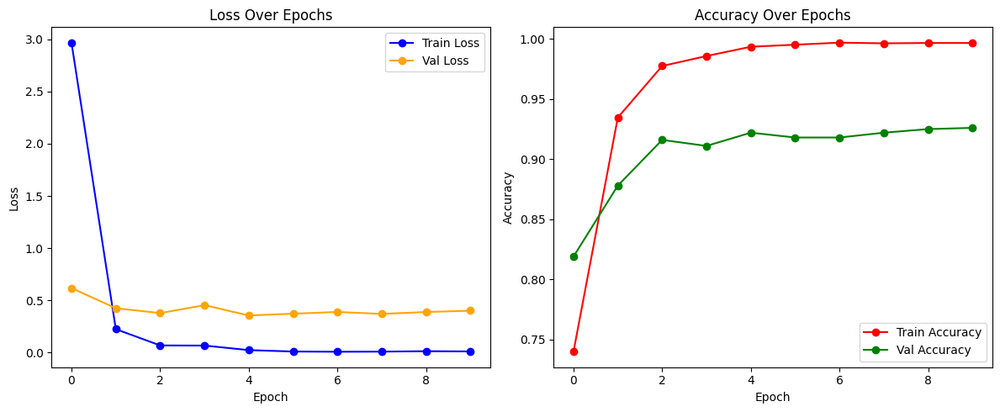

In [62]:
# Plotting training and validation loss and accuracy
plt.figure(figsize=(12, 5))

# Loss
plt.subplot(1, 2, 1)
plt.plot(VGG19_history.history['loss'], label='Train Loss', marker='o', color='blue')
plt.plot(VGG19_history.history['val_loss'], label='Val Loss', marker='o', color='orange')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(VGG19_history.history['accuracy'], label='Train Accuracy', marker='o', color='red')
plt.plot(VGG19_history.history['val_accuracy'], label='Val Accuracy', marker='o', color='green')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step


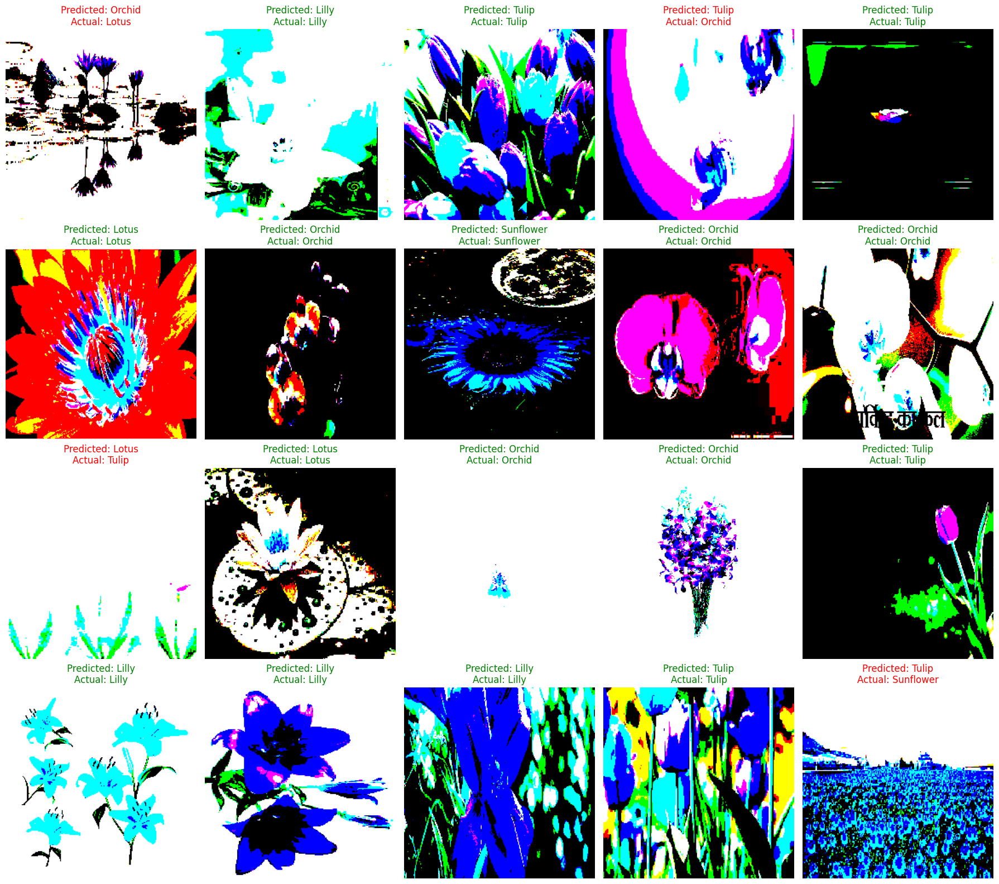

In [63]:
# Get class indices 
class_indices = VGG19_pred_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Get a batch of images and labels
images, labels = next(VGG19_pred_generator)

# Predict on this batch
predictions = VGG19_model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(labels, axis=1)

# Plot first 20 predictions
plt.figure(figsize=(18, 16))  
for i in range(20):
    plt.subplot(4, 5, i+1)  
    plt.imshow(images[i])
    plt.axis('off')
    plt.title(f"Predicted: {idx_to_class[predicted_classes[i]]}\nActual: {idx_to_class[true_classes[i]]}",
              color="green" if predicted_classes[i]==true_classes[i] else "red")
plt.tight_layout()
plt.show()

In [64]:
# Evaluate the model
results = VGG19_model.evaluate(VGG19_pred_generator, verbose=1)

# If you have only loss and accuracy:
loss_VGG19 = results[0]
accuracy_VGG19 = results[1]

# Print loss and accuracy
print(f"Test Loss : {loss_VGG16}")
print(f"Test Accuracy: {accuracy_VGG19}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 143ms/step - accuracy: 0.9400 - loss: 0.2447 - precision: 0.9507 - recall: 0.9278
Test Loss : 0.3548195958137512
Test Accuracy: 0.9341317415237427


In [65]:
y_pred_probs = VGG19_model.predict(VGG19_pred_generator, verbose=1)

# Convert probabilities to class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Get true labels from the generator
y_true = VGG16_pred_generator.classes

# Get class names (labels) from the generator
target_names = list(VGG19_pred_generator.class_indices.keys())
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step
Classification Report:
              precision    recall  f1-score   support

       Lilly       0.18      0.18      0.18       101
       Lotus       0.14      0.14      0.14       100
      Orchid       0.18      0.18      0.18       100
   Sunflower       0.23      0.23      0.23       100
       Tulip       0.17      0.18      0.18       100

    accuracy                           0.18       501
   macro avg       0.18      0.18      0.18       501
weighted avg       0.18      0.18      0.18       501



In [66]:
 print(confusion_matrix(y_true,y_pred))

[[18 21 23 19 20]
 [23 14 21 21 21]
 [18 21 18 19 24]
 [14 19 23 23 21]
 [25 25 16 16 18]]


# ResNet50V2 Model

## ResNet50V2 Data Generators

In [ ]:
train_path = '/kaggle/working/dataset_split/train'
test_path = '/kaggle/working/dataset_split/test'
pred_path = '/kaggle/working/dataset_split/pred'

In [ ]:
IMG_SIZE = 224
batch_size = 32

In [67]:
ResNet_train_datagen = ImageDataGenerator(preprocessing_function=preprocess_resnet50v2)
ResNet_train_generator = ResNet_train_datagen.flow_from_directory(
        train_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 3499 images belonging to 5 classes.


In [70]:
ResNet_train_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [90]:
ResNet_pred_datagen = ImageDataGenerator(preprocessing_function=preprocess_resnet50v2)
ResNet_pred_generator = ResNet_pred_datagen.flow_from_directory(
        pred_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 501 images belonging to 5 classes.


In [69]:
ResNet_pred_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [89]:
ResNet_val_datagen = ImageDataGenerator(preprocessing_function=preprocess_resnet50v2)
ResNet_val_generator = ResNet_val_datagen.flow_from_directory(
        test_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 999 images belonging to 5 classes.


In [72]:
ResNet_val_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

## ResNet50V2 Modeling

In [73]:
trained_ResNet_layers = ResNet50V2(weights='imagenet',include_top=False,input_shape=(IMG_SIZE,IMG_SIZE,3))

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [75]:
for layer in trained_ResNet_layers.layers:
    layer.trainable = False


In [76]:
ResNet_model = keras.models.Sequential([
    trained_ResNet_layers,
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(len(ResNet_val_generator.class_indices), activation='softmax')
]) 

In [77]:
ResNet_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50v2 (Functional)              │ (None, 7, 7, 2048)          │      23,564,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 256)                 │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,090,629 (91.90 MB)

 Trainable params: 525,829 (2.01 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

In [128]:
callbacks = [
    EarlyStopping(
        monitor='val_loss',    
        patience=5,             
        restore_best_weights=True
    ),
    
    ModelCheckpoint(
        filepath='ResNet_best_model.keras',  
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False, 
        mode='min',
        verbose=1
    )
]

In [79]:
ResNet_model.compile(optimizer=keras.optimizers.Adam(), 
              loss=keras.losses.CategoricalCrossentropy(), 
               metrics=['accuracy',keras.metrics.Precision(name='precision'),keras.metrics.Recall(name='recall')
])

In [80]:
ResNet_history = ResNet_model.fit(
        ResNet_train_generator,
        epochs = 20,
        validation_data = ResNet_val_generator,
        callbacks = callbacks
        )

Epoch 1/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.6910 - loss: 0.8855 - precision: 0.7534 - recall: 0.6076
Epoch 1: val_loss improved from inf to 0.33762, saving model to ResNet_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 40s 227ms/step - accuracy: 0.6929 - loss: 0.8802 - precision: 0.7550 - recall: 0.6100 - val_accuracy: 0.8879 - val_loss: 0.3376 - val_precision: 0.9099 - val_recall: 0.8689
Epoch 2/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9285 - loss: 0.2325 - precision: 0.9398 - recall: 0.9143
Epoch 2: val_loss improved from 0.33762 to 0.27483, saving model to ResNet_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.9286 - loss: 0.2321 - precision: 0.9399 - recall: 0.9144 - val_accuracy: 0.9139 - val_loss: 0.2748 - val_precision: 0.9267 - val_recall: 0.8989
Epoch 3/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.9648 - loss: 0.1226 - precision: 0.9692 - recall: 0.9585
Epoch 3: val_loss improved from 0.27483 to 

In [130]:
ResNet_model.save("flower_model.h5")

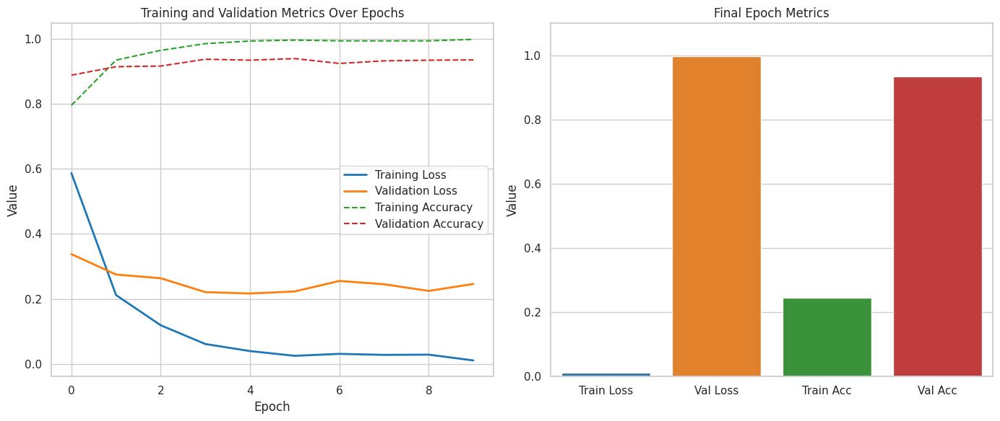

In [84]:
import seaborn as sns
# Apply Seaborn style
sns.set(style="whitegrid")

# Get last epoch values for bar chart
last_epoch = len(ResNet_history.history['loss']) - 1
metrics = ['loss', 'accuracy']
train_last = [ResNet_history.history['loss'][last_epoch], ResNet_history.history['accuracy'][last_epoch]]
val_last = [ResNet_history.history['val_loss'][last_epoch], ResNet_history.history['val_accuracy'][last_epoch]]

# Plot
plt.figure(figsize=(14, 6))

# Line Plot (Trend Over Epochs)
plt.subplot(1, 2, 1)
plt.plot(ResNet_history.history['loss'], label='Training Loss', color='#1f77b4', linewidth=2)
plt.plot(ResNet_history.history['val_loss'], label='Validation Loss', color='#ff7f0e', linewidth=2)
plt.plot(ResNet_history.history['accuracy'], label='Training Accuracy', color='#2ca02c', linestyle='--')
plt.plot(ResNet_history.history['val_accuracy'], label='Validation Accuracy', color='#d62728', linestyle='--')
plt.title('Training and Validation Metrics Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.grid(True)

# Bar Plot (Final Epoch)
plt.subplot(1, 2, 2)
x = ['Train Loss', 'Val Loss', 'Train Acc', 'Val Acc']
y = train_last + val_last
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
sns.barplot(x=x, y=y, palette=colors)
plt.title('Final Epoch Metrics')
plt.ylim(0, 1.1)
plt.ylabel('Value')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


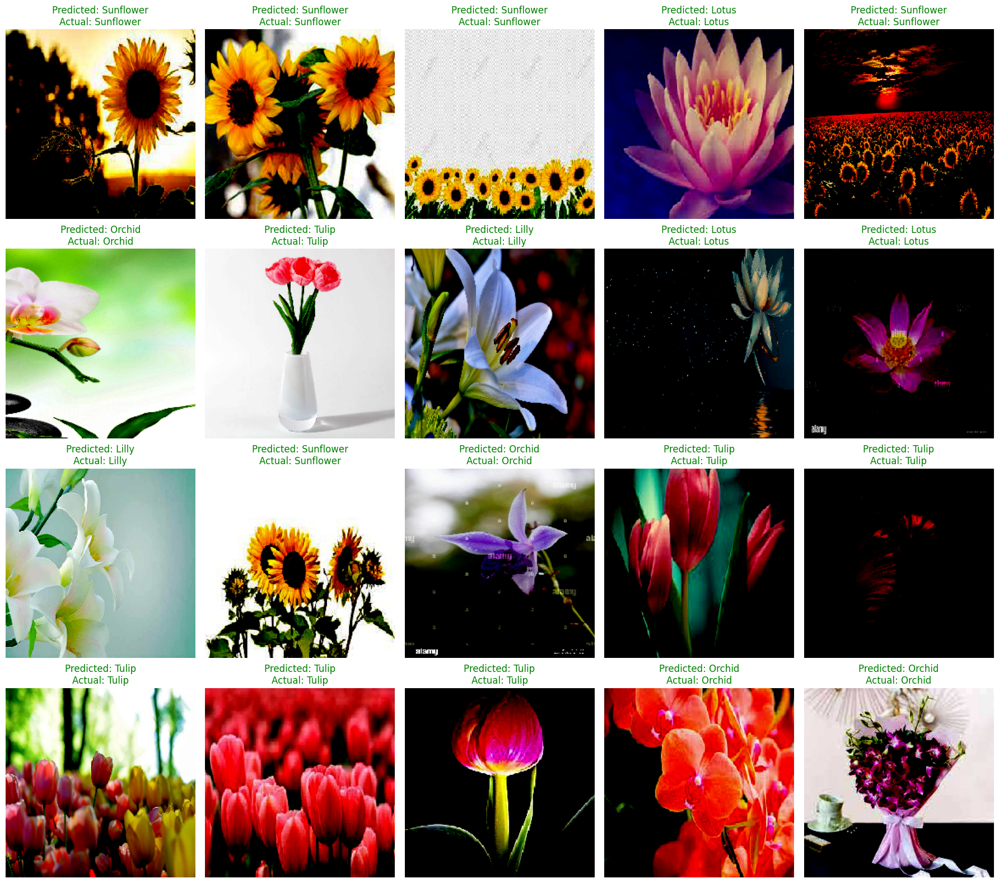

In [85]:
# Get class indices 
class_indices = ResNet_pred_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Get a batch of images and labels
images, labels = next(ResNet_pred_generator)

# Predict on this batch
predictions = ResNet_model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(labels, axis=1)

# Plot first 20 predictions
plt.figure(figsize=(18, 16))  
for i in range(20):
    plt.subplot(4, 5, i+1)  
    plt.imshow(images[i])
    plt.axis('off')
    plt.title(f"Predicted: {idx_to_class[predicted_classes[i]]}\nActual: {idx_to_class[true_classes[i]]}",
              color="green" if predicted_classes[i]==true_classes[i] else "red")
plt.tight_layout()
plt.show()

In [86]:
# Evaluate the model
results = ResNet_model.evaluate(ResNet_pred_generator, verbose=1)

# If you have only loss and accuracy:
loss_RestNet = results[0]
accuracy_RestNet = results[1]

# Print loss and accuracy
print(f"Test Loss: {loss_RestNet}")
print(f"Test Accuracy: {accuracy_RestNet}")


16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 302ms/step - accuracy: 0.9461 - loss: 0.1851 - precision: 0.9532 - recall: 0.9361
Test Loss: 0.18392401933670044
Test Accuracy: 0.9520958065986633


In [92]:
y_pred_probs = ResNet_model.predict(ResNet_pred_generator, verbose=1)

# Convert probabilities to class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Get true labels from the generator
y_true = ResNet_pred_generator.classes

# Get class names (labels) from the generator
target_names = list(ResNet_pred_generator.class_indices.keys())
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))


16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step
Classification Report:
              precision    recall  f1-score   support

       Lilly       0.19      0.18      0.18       101
       Lotus       0.16      0.16      0.16       100
      Orchid       0.14      0.15      0.15       100
   Sunflower       0.20      0.20      0.20       100
       Tulip       0.15      0.15      0.15       100

    accuracy                           0.17       501
   macro avg       0.17      0.17      0.17       501
weighted avg       0.17      0.17      0.17       501



In [93]:
 print(confusion_matrix(y_true,y_pred))

[[18 21 20 23 19]
 [22 16 21 16 25]
 [15 26 15 18 26]
 [20 21 23 20 16]
 [20 16 25 24 15]]


# MobileNetV2 Model

## MobileNetV2 Data Generators

In [71]:
train_path = '/kaggle/working/dataset_split/train'
test_path = '/kaggle/working/dataset_split/test'
pred_path = '/kaggle/working/dataset_split/pred'

In [72]:
IMG_SIZE = 224
batch_size = 32

In [94]:
MobileNet_train_datagen = ImageDataGenerator(preprocessing_function=preprocess_mobilenetv2)
MobileNet_train_generator = MobileNet_train_datagen.flow_from_directory(
        train_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 3499 images belonging to 5 classes.


In [74]:
MobileNet_train_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [95]:
MobileNet_val_datagen = ImageDataGenerator(preprocessing_function=preprocess_mobilenetv2)
MobileNet_val_generator = MobileNet_val_datagen.flow_from_directory(
        test_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 999 images belonging to 5 classes.


In [76]:
MobileNet_val_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

In [96]:
MobileNet_pred_datagen = ImageDataGenerator(preprocessing_function=preprocess_mobilenetv2)
MobileNet_pred_generator = MobileNet_pred_datagen.flow_from_directory(
        pred_path,
        target_size=(IMG_SIZE,IMG_SIZE),
        batch_size=batch_size,
        class_mode='categorical')

Found 501 images belonging to 5 classes.


In [97]:
MobileNet_pred_generator.class_indices

{'Lilly': 0, 'Lotus': 1, 'Orchid': 2, 'Sunflower': 3, 'Tulip': 4}

## MobileNetV2 Modeling

In [98]:
trained_MobileNet_layers = MobileNetV2(weights='imagenet',include_top=False,input_shape=(IMG_SIZE,IMG_SIZE,3))

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [100]:
for layer in trained_MobileNet_layers.layers:
    layer.trainable = False


In [102]:
MobileNet_model = keras.models.Sequential([
    trained_MobileNet_layers,
    keras.layers.GlobalAveragePooling2D(),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(len(MobileNet_val_generator.class_indices), activation='softmax')
]) 

In [103]:
MobileNet_model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 256)                 │         327,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 5)                   │           1,285 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,587,205 (9.87 MB)

 Trainable params: 329,221 (1.26 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [104]:
callbacks = [
    EarlyStopping(
        monitor='val_loss',    
        patience=5,             
        restore_best_weights=True
    ),
    
    ModelCheckpoint(
        filepath='MobileNet_best_model.keras',  
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=False, 
        mode='min',
        verbose=1
    )
]

In [105]:
MobileNet_model.compile(optimizer=keras.optimizers.Adam(), 
              loss=keras.losses.CategoricalCrossentropy(), 
               metrics=['accuracy',keras.metrics.Precision(name='precision'),keras.metrics.Recall(name='recall')
])

In [106]:
MobileNet_history = MobileNet_model.fit(
        MobileNet_train_generator,
        epochs = 20,
        validation_data = MobileNet_val_generator,
        callbacks = callbacks
        )

Epoch 1/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.6824 - loss: 0.8281 - precision: 0.7727 - recall: 0.5853
Epoch 1: val_loss improved from inf to 0.33822, saving model to MobileNet_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 33s 202ms/step - accuracy: 0.6843 - loss: 0.8235 - precision: 0.7740 - recall: 0.5881 - val_accuracy: 0.8679 - val_loss: 0.3382 - val_precision: 0.8836 - val_recall: 0.8438
Epoch 2/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9047 - loss: 0.2720 - precision: 0.9331 - recall: 0.8886
Epoch 2: val_loss improved from 0.33822 to 0.29545, saving model to MobileNet_best_model.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - accuracy: 0.9046 - loss: 0.2720 - precision: 0.9329 - recall: 0.8886 - val_accuracy: 0.9029 - val_loss: 0.2955 - val_precision: 0.9156 - val_recall: 0.8799
Epoch 3/20
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.9394 - loss: 0.1813 - precision: 0.9482 - recall: 0.9279
Epoch 3: val_loss improved from 0.295

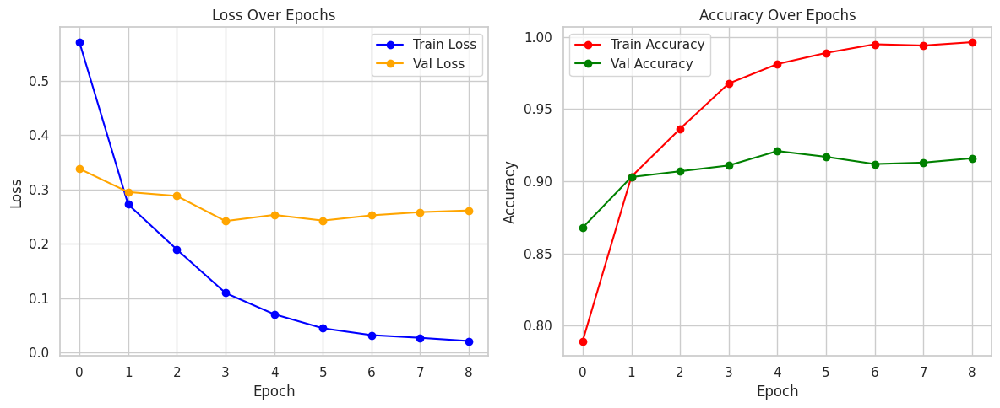

In [107]:
# Plotting training and validation loss and accuracy
plt.figure(figsize=(12, 5))

#  Loss
plt.subplot(1, 2, 1)
plt.plot(MobileNet_history.history['loss'], label='Train Loss', marker='o', color='blue')
plt.plot(MobileNet_history.history['val_loss'], label='Val Loss', marker='o', color='orange')
plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

#  Accuracy
plt.subplot(1, 2, 2)
plt.plot(MobileNet_history.history['accuracy'], label='Train Accuracy', marker='o', color='red')
plt.plot(MobileNet_history.history['val_accuracy'], label='Val Accuracy', marker='o', color='green')
plt.title('Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


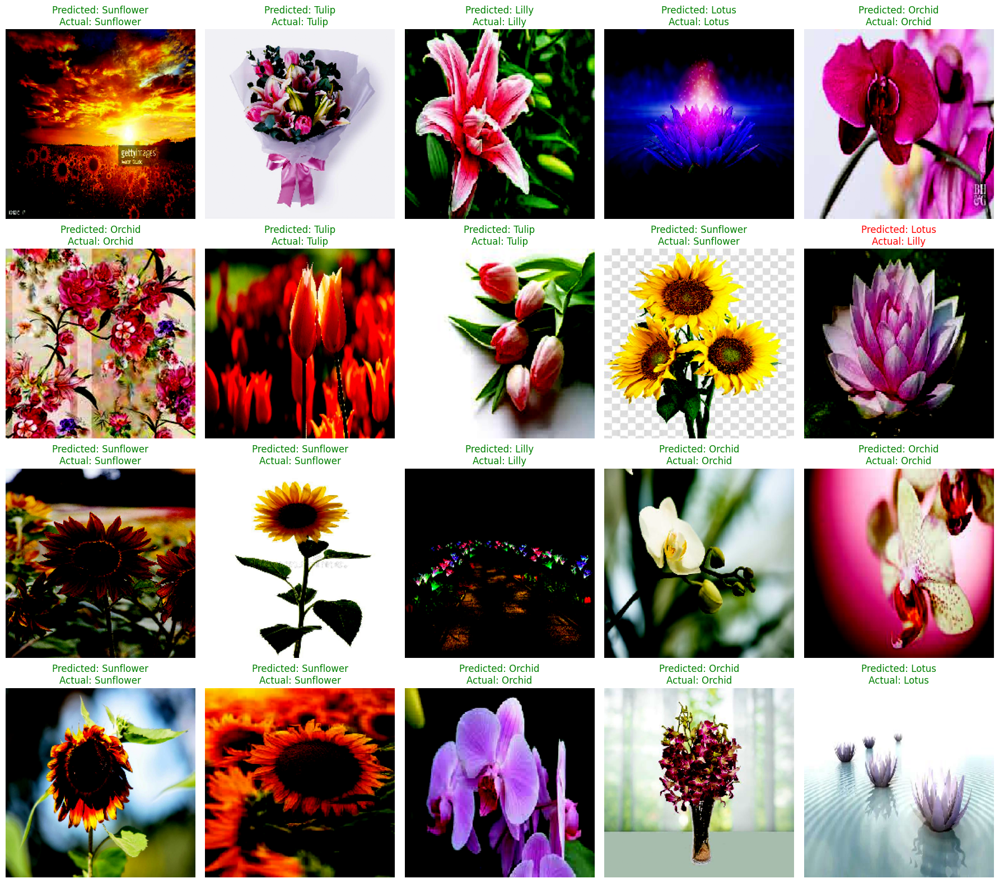

In [108]:
# Get class indices 
class_indices = MobileNet_pred_generator.class_indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Get a batch of images and labels
images, labels = next(MobileNet_pred_generator)

# Predict on this batch
predictions = MobileNet_model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(labels, axis=1)

# Plot first 20 predictions
plt.figure(figsize=(18, 16))  
for i in range(20):
    plt.subplot(4, 5, i+1)  
    plt.imshow(images[i])
    plt.axis('off')
    plt.title(f"Predicted: {idx_to_class[predicted_classes[i]]}\nActual: {idx_to_class[true_classes[i]]}",
              color="green" if predicted_classes[i]==true_classes[i] else "red")
plt.tight_layout()
plt.show()

In [109]:
# Evaluate the model
results = MobileNet_model.evaluate(MobileNet_pred_generator, verbose=1)

# If you have only loss and accuracy:
loss_MobileNet = results[0]
accuracy_MobileNet = results[1]

# Print loss and accuracy
print(f"Test Loss: {loss_MobileNet}")
print(f"Test Accuracy: {accuracy_MobileNet}")

16/16 ━━━━━━━━━━━━━━━━━━━━ 4s 274ms/step - accuracy: 0.9038 - loss: 0.3270 - precision: 0.9169 - recall: 0.8930
Test Loss: 0.26381102204322815
Test Accuracy: 0.9201596975326538


In [110]:
y_pred_probs = MobileNet_model.predict(MobileNet_pred_generator, verbose=1)

# Convert probabilities to class labels
y_pred = np.argmax(y_pred_probs, axis=1)

# Get true labels from the generator
y_true = MobileNet_pred_generator.classes

# Get class names (labels) from the generator
target_names = list(MobileNet_pred_generator.class_indices.keys())
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))



16/16 ━━━━━━━━━━━━━━━━━━━━ 8s 330ms/step
Classification Report:
              precision    recall  f1-score   support

       Lilly       0.19      0.19      0.19       101
       Lotus       0.13      0.12      0.13       100
      Orchid       0.18      0.20      0.19       100
   Sunflower       0.20      0.20      0.20       100
       Tulip       0.22      0.22      0.22       100

    accuracy                           0.19       501
   macro avg       0.18      0.19      0.18       501
weighted avg       0.18      0.19      0.18       501



In [111]:

 print(confusion_matrix(y_true,y_pred))

[[19 23 23 16 20]
 [19 12 24 26 19]
 [21 17 20 19 23]
 [20 16 27 20 17]
 [20 22 15 21 22]]


# Compare Between Models

In [112]:
history = {
    "CNN": {"accuracy": cnn_history.history['accuracy'],"val_accuracy": cnn_history.history['val_accuracy'] ,"loss": cnn_history.history['loss'],"val_loss": cnn_history.history['val_loss']},
    "CNN2": {"accuracy": cnn2_history.history['accuracy'],"val_accuracy": cnn2_history.history['val_accuracy'] ,"loss": cnn2_history.history['loss'],"val_loss": cnn2_history.history['val_loss']},
    
    "MobileNetV2": {"accuracy": MobileNet_history.history['accuracy'],"val_accuracy": MobileNet_history.history['val_accuracy'], "loss": MobileNet_history.history['loss'],"val_loss": MobileNet_history.history['val_loss']},
    "VGG16": {"accuracy": VGG16_history.history['accuracy'],"val_accuracy": VGG16_history.history['val_accuracy'], "loss": VGG16_history.history['loss'],"val_loss": VGG16_history.history['val_loss']},
    "VGG19": {"accuracy": VGG19_history.history['accuracy'],"val_accuracy": VGG19_history.history['val_accuracy'], "loss": VGG19_history.history['loss'],"val_loss": VGG19_history.history['val_loss']},
    "ResNet50V2": {"accuracy": ResNet_history.history['accuracy'],"val_accuracy": ResNet_history.history['val_accuracy'], "loss": ResNet_history.history['loss'],"val_loss": ResNet_history.history['val_loss']}
}

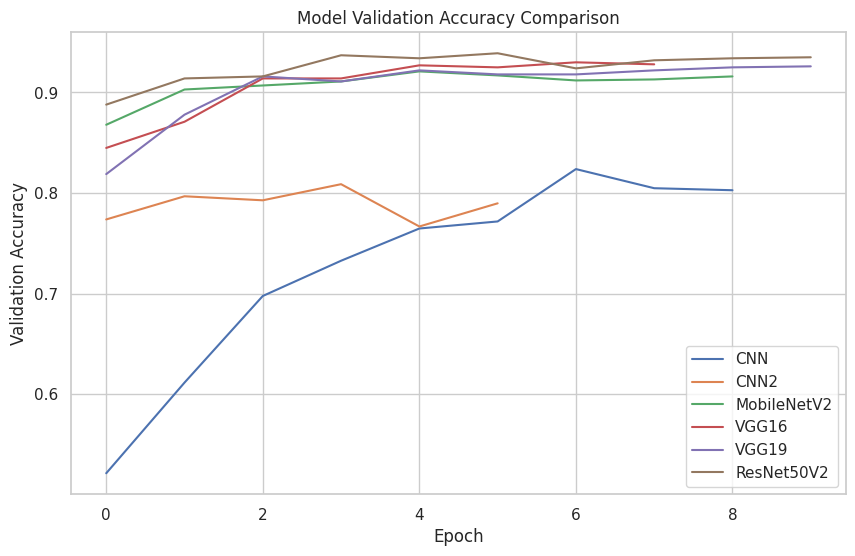

In [113]:
plt.figure(figsize=(10, 6))
for model, values in history.items():
    plt.plot(values['val_accuracy'], label=model)
plt.title('Model Validation Accuracy Comparison')
plt.ylabel('Validation Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.grid(True)
plt.show()

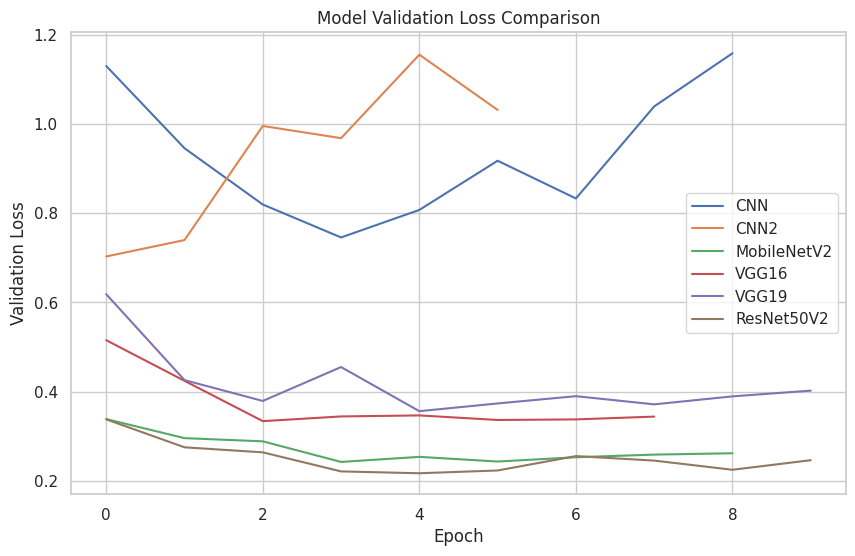

In [114]:
plt.figure(figsize=(10, 6))
for model, values in history.items():
    plt.plot(values['val_loss'], label=model)
plt.title('Model Validation Loss Comparison')
plt.ylabel('Validation Loss')
plt.xlabel('Epoch')
plt.legend()
plt.grid(True)
plt.show()


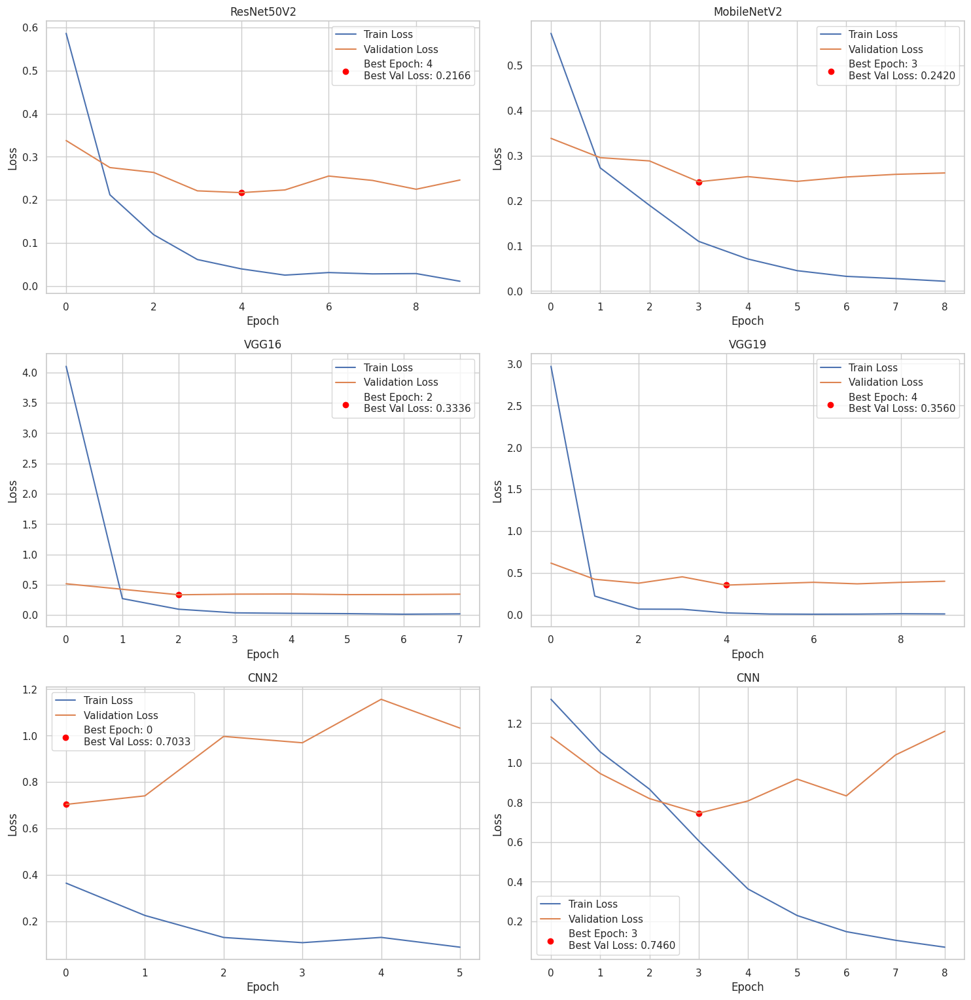

In [115]:
plt.figure(figsize=(15, 20))

# Sort models by least validation loss
sorted_models = sorted(history.items(), key=lambda x: min(x[1]['val_loss']))

# Plot each model based on sorted order of least val_loss
for i, (model_name, model_history) in enumerate(sorted_models, 1):
    plt.subplot(4, 2, i) 
    plt.plot(model_history['loss'], label='Train Loss')
    plt.plot(model_history['val_loss'], label='Validation Loss')

    # Find the best epoch based on least val_loss
    min_val_loss_epoch = model_history['val_loss'].index(min(model_history['val_loss']))
    min_val_loss = min(model_history['val_loss'])

    plt.scatter(min_val_loss_epoch, min_val_loss, color='red', label=f'Best Epoch: {min_val_loss_epoch}\nBest Val Loss: {min_val_loss:.4f}')

    plt.title(model_name)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

plt.tight_layout()
plt.show()


In [116]:
best_CNN = load_model('/kaggle/working/CNN_best_model.keras')
best_CNN2 = load_model('/kaggle/working/CNN2_best_model.keras')
best_MobileNetV2 = load_model('/kaggle/working/MobileNet_best_model.keras')
best_VGG16 = load_model('/kaggle/working/VGG16_best_model.keras')
best_VGG19 = load_model('/kaggle/working/VGG19_best_model.keras')
best_ResNet50 = load_model('/kaggle/working/ResNet_best_model.keras')

In [117]:
models = ['Best CNN','Best CNN2','Best MobileNetV2','Best VGG16','Best VGG19','Best ResNest50']
best_train_accuracy= [
                        cnn_history.history['accuracy'][np.argmax(cnn_history.history['val_accuracy'])],
                        cnn2_history.history['accuracy'][np.argmax(cnn2_history.history['val_accuracy'])],
                        MobileNet_history.history['accuracy'][np.argmax(MobileNet_history.history['val_accuracy'])],
                        VGG16_history.history['accuracy'][np.argmax(VGG16_history.history['val_accuracy'])],
                        VGG19_history.history['accuracy'][np.argmax(VGG19_history.history['val_accuracy'])],
                        ResNet_history.history['accuracy'][np.argmax(ResNet_history.history['val_accuracy'])]
                     ]
best_val_accuracy= [
                        cnn_history.history['val_accuracy'][np.argmax(cnn_history.history['val_accuracy'])],
                        cnn2_history.history['accuracy'][np.argmax(cnn2_history.history['val_accuracy'])],
                        MobileNet_history.history['val_accuracy'][np.argmax(MobileNet_history.history['val_accuracy'])],
                        VGG16_history.history['val_accuracy'][np.argmax(VGG16_history.history['val_accuracy'])],
                        VGG19_history.history['val_accuracy'][np.argmax(VGG19_history.history['val_accuracy'])],
                        ResNet_history.history['val_accuracy'][np.argmax(ResNet_history.history['val_accuracy'])]
                     ]

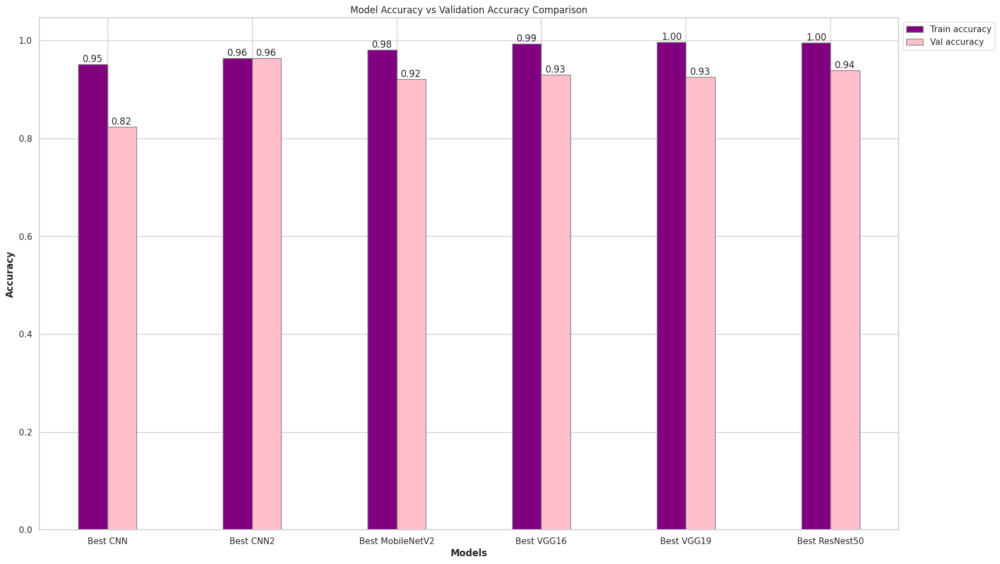

In [118]:
barWidth = 0.20

r1 = np.arange(len(best_train_accuracy))
r2 = [x + barWidth for x in r1]

plt.figure(figsize=(20, 12))
bars1 = plt.bar(r1, best_train_accuracy, color='purple', width=barWidth, edgecolor='grey', label='Train accuracy')
bars2 = plt.bar(r2, best_val_accuracy, color='pink', width=barWidth, edgecolor='grey', label='Val accuracy')

plt.xlabel('Models', fontweight='bold')
plt.ylabel('Accuracy', fontweight='bold')
plt.xticks([r + barWidth/2 for r in range(len(best_train_accuracy))], models)

def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', ha='center', va='bottom')

add_labels(bars1)
add_labels(bars2)

plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title('Model Accuracy vs Validation Accuracy Comparison')
plt.show()

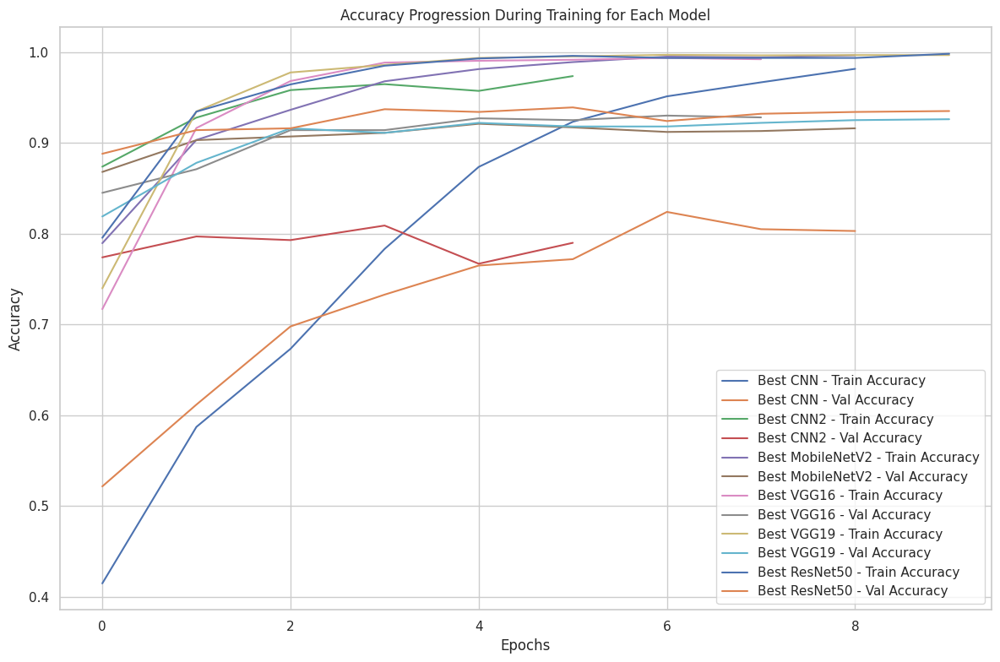

In [119]:
#  Line Plot to see accuracy progression 
# Here, we will use the full history of accuracy to plot the training curves for each model

plt.figure(figsize=(12, 8))

# Plotting each model's training and validation accuracy history
plt.plot(cnn_history.history['accuracy'], label='Best CNN - Train Accuracy')
plt.plot(cnn_history.history['val_accuracy'], label='Best CNN - Val Accuracy')
plt.plot(cnn2_history.history['accuracy'], label='Best CNN2 - Train Accuracy')
plt.plot(cnn2_history.history['val_accuracy'], label='Best CNN2 - Val Accuracy')
plt.plot(MobileNet_history.history['accuracy'], label='Best MobileNetV2 - Train Accuracy')
plt.plot(MobileNet_history.history['val_accuracy'], label='Best MobileNetV2 - Val Accuracy')
plt.plot(VGG16_history.history['accuracy'], label='Best VGG16 - Train Accuracy')
plt.plot(VGG16_history.history['val_accuracy'], label='Best VGG16 - Val Accuracy')
plt.plot(VGG19_history.history['accuracy'], label='Best VGG19 - Train Accuracy')
plt.plot(VGG19_history.history['val_accuracy'], label='Best VGG19 - Val Accuracy')
plt.plot(ResNet_history.history['accuracy'], label='Best ResNet50 - Train Accuracy')
plt.plot(ResNet_history.history['val_accuracy'], label='Best ResNet50 - Val Accuracy')

plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Progression During Training for Each Model')
plt.legend(loc='lower right')

plt.tight_layout()
plt.show()

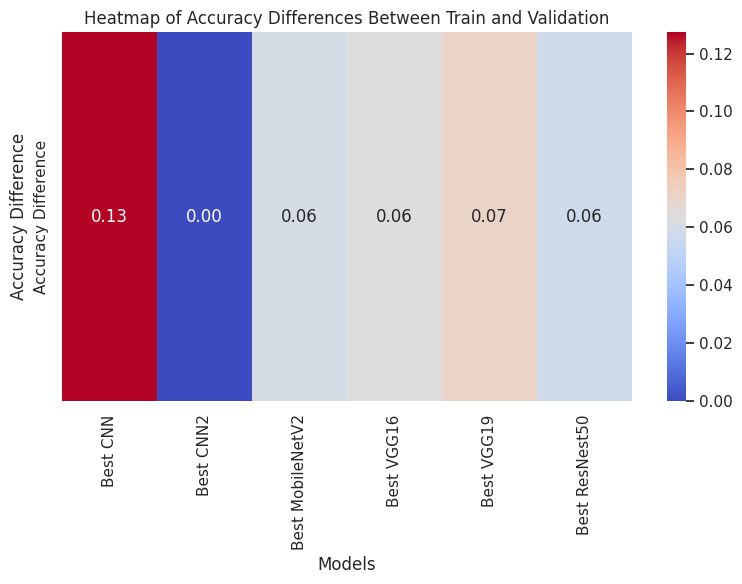

In [120]:

# Calculate accuracy difference
accuracy_diff = np.array(best_train_accuracy) - np.array(best_val_accuracy)

# Create heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(accuracy_diff.reshape(1, -1), annot=True, fmt='.2f', cmap='coolwarm', 
            xticklabels=models, yticklabels=['Accuracy Difference'])
plt.title('Heatmap of Accuracy Differences Between Train and Validation')
plt.xlabel('Models')
plt.ylabel('Accuracy Difference')
plt.tight_layout()
plt.show()


# Select the best model 

In [131]:
# Dictionary of model names and their accuracies
accuracies = {
    'CNN': accuracy_cnn,
    'CNN2': accuracy_cnn2,
    'ResNet50': accuracy_RestNet,
    'VGG16': accuracy_VGG16,
    'VGG19': accuracy_VGG19,
    'MobileNetV2': accuracy_MobileNet
}

# Find the best model based on max accuracy
best_model_name = max(accuracies, key=accuracies.get)
best_accuracy = accuracies[best_model_name]

print(f"✅ Best Model: {best_model_name} with Accuracy: {best_accuracy:.4f}")



✅ Best Model: ResNet50 with Accuracy: 0.9521


# Trying an unseen data to applt inference pipline

In [136]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

# Load the trained flower model
model = load_model("flower_model.h5")

class_names = ['Lotus','Sunflower', 'Tulip', 'Lily', 'Orchid' ]

def preprocess_image(img_path, img_size=(224, 224)):
    # Load and resize the image
    img = image.load_img(img_path, target_size=img_size)
    # Convert the image to a numpy array and preprocess it
    img_array = image.img_to_array(img)
    img_array = tf.keras.applications.resnet50.preprocess_input(img_array)
    # Add an extra dimension to match the model input shape (batch size)
    return np.expand_dims(img_array, axis=0)

# Prediction function
def predict_image(img_path):
    img_tensor = preprocess_image(img_path)
    # Get the model's prediction
    prediction = model.predict(img_tensor)
    # Get the predicted class and the confidence level
    pred_class = class_names[np.argmax(prediction)]
    confidence = np.max(prediction)
    return pred_class, confidence

# Run inference
img_path = "/kaggle/input/lotuss/Lotuss.jpg"  # Example image path, update with actual path
predicted_class, confidence = predict_image(img_path)
print(f"Predicted: {predicted_class} ({confidence*100:.2f}%)")


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted: Lotus (100.00%)
